#  Data Structures- Space and Time Complexity
> Observing the time complexity of different algorithms
- toc: true
- badges: false
- comments: true
- permalink: /week27/spaceandtime
- categories: [week 27]

# Space and Time Complexity
> Space complexity refers to the amount of memory used by an algorithm to complete its execution, as a function of the size of the input. The space complexity of an algorithm can be affected by various factors such as the size of the input data, the data structures used in the algorithm, the number and size of temporary variables, and the recursion depth. Time complexity refers to the amount of time required by an algorithm to run as the input size grows. It is usually measured in terms of the "Big O" notation, which describes the upper bound of an algorithm's time complexity.

- Why do you think a programmer should care about space and time complexity?

Writing effective algorithms can considerably enhance software systems' performance and scalability, which is crucial for producing high-quality and user-friendly applications.

Take a look at our lassen volcano example from the data compression tech talk. The first code block is the original image. In the second code block, change the baseWidth to rescale the image. 

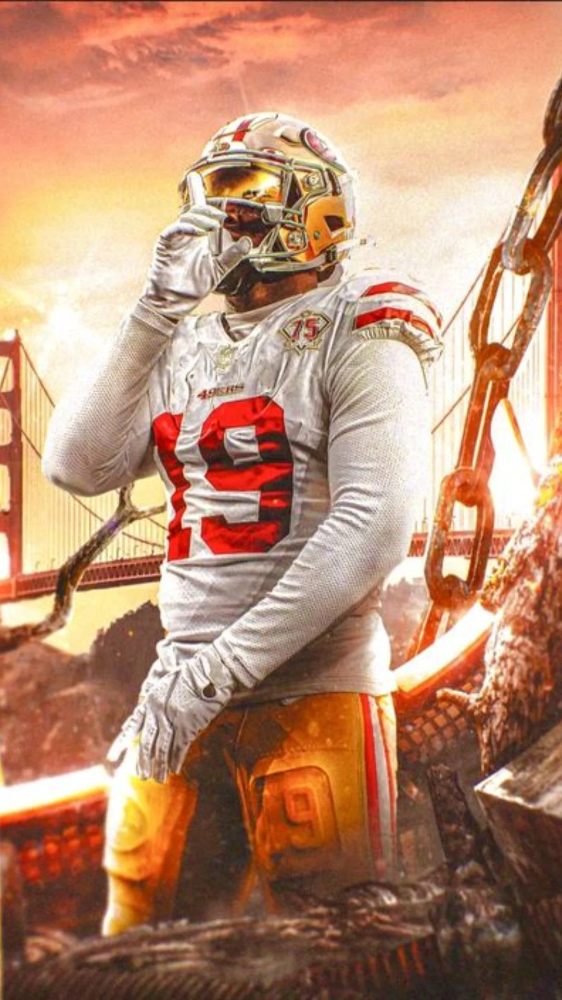

In [1]:
from IPython.display import Image, display
from pathlib import Path 

# prepares a series of images
def image_data(path=Path("images/"), images=None):  # path of static images is defaulted
    for image in images:
        # File to open
        image['filename'] = path / image['file']  # file with path
    return images

def image_display(images):
    for image in images:  
        display(Image(filename=image['filename']))

if __name__ == "__main__":
    lassen_volcano = image_data(images=[{'source': "Deebo Samuel", 'label': "Deebo Shush", 'file': "deebo.png"}])
    image_display(lassen_volcano)
    

---- meta data -----
Deebo Shush
Deebo Samuel
PNG
RGB
Original size:  (1080, 1920)  pixels:  2,073,600
Scaled size:  (2500, 4444)  pixels:  11,110,000
-- original image --



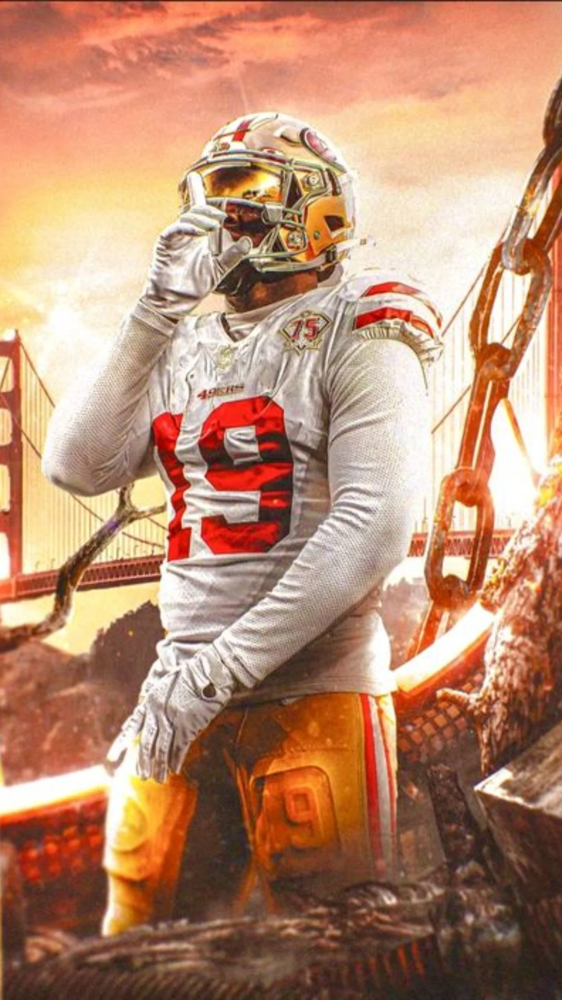

In [2]:
from IPython.display import HTML, display
from pathlib import Path 
from PIL import Image as pilImage 
from io import BytesIO
import base64

# prepares a series of images
def image_data(path=Path("images/"), images=None):  # path of static images is defaulted
    for image in images:
        # File to open
        image['filename'] = path / image['file']  # file with path
    return images

def scale_image(img):
    #baseWidth = 625
    #baseWidth = 1250
    baseWidth = 2500
    # baseWidth = 5000 # see the effect of doubling or halfing the baseWidth 
    # baseWidth = 10000 
    #baseWidth = 20000
    #baseWidth = 40000
    scalePercent = (baseWidth/float(img.size[0]))
    scaleHeight = int((float(img.size[1])*float(scalePercent)))
    scale = (baseWidth, scaleHeight)
    return img.resize(scale)

def image_to_base64(img, format):
    with BytesIO() as buffer:
        img.save(buffer, format)
        return base64.b64encode(buffer.getvalue()).decode()
    
def image_management(image):  # path of static images is defaulted        
    # Image open return PIL image object
    img = pilImage.open(image['filename'])
    
    # Python Image Library operations
    image['format'] = img.format
    image['mode'] = img.mode
    image['size'] = img.size
    image['width'], image['height'] = img.size
    image['pixels'] = image['width'] * image['height']
    # Scale the Image
    img = scale_image(img)
    image['pil'] = img
    image['scaled_size'] = img.size
    image['scaled_width'], image['scaled_height'] = img.size
    image['scaled_pixels'] = image['scaled_width'] * image['scaled_height']
    # Scaled HTML
    image['html'] = '<img src="data:image/png;base64,%s">' % image_to_base64(image['pil'], image['format'])


if __name__ == "__main__":
    # Use numpy to concatenate two arrays
    images = image_data(images = [{'source': "Deebo Samuel", 'label': "Deebo Shush", 'file': "deebo.png"}])
    
    # Display meta data, scaled view, and grey scale for each image
    for image in images:
        image_management(image)
        print("---- meta data -----")
        print(image['label'])
        print(image['source'])
        print(image['format'])
        print(image['mode'])
        print("Original size: ", image['size'], " pixels: ", f"{image['pixels']:,}")
        print("Scaled size: ", image['scaled_size'], " pixels: ", f"{image['scaled_pixels']:,}")
        
        print("-- original image --")
        display(HTML(image['html'])) 


> Do you think this is a time complexity or space complexity or both problem?
- Although there are two issues, space complexity is ultimately the bigger one. Space complexity is a bigger issue because larger images consume more memory and space. Time complexity is a result of space complexity; the bigger the image, the longer it takes for the program to run.

## Big O Notation
- Constant O(1)
- Linear O(n)
- Quadratic O(n^2) 
- Logarithmic O(logn)
- Exponential (O(2^n))

In [3]:
#create a list called numbers with 1,000 numbers in it
numbers = list(range(100))
print(numbers)


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]


# Constant O(1)

No matter how big something gets, we can go to it instantly

### Time
> An example of a constant time algorithm is accessing a specific element in an array. It does not matter how large the array is, accessing an element in the array takes the same amount of time. Therefore, the time complexity of this operation is constant, denoted by O(1).

In [4]:
#prints the number at index 263
print(numbers[23])

ncaa_bb_ranks = {1:"Alabama", 2:"Houston", 3:"Purdue", 4:"Kansas"}
#look up a value in a dictionary given a key
print(ncaa_bb_ranks[1])

23
Alabama


### Space
> This function takes two number inputs and returns their sum. The function does not create any additional data structures or variables that are dependent on the input size, so its space complexity is constant, or O(1). Regardless of how large the input numbers are, the function will always require the same amount of memory to execute.

In [5]:
#function that takes the sum of two numbers
def sum(a, b): 
  return a + b

print(sum(90,88))
print(sum(.9,.88))

178
1.78


# Linear O(n)

### Time
> An example of a linear time algorithm is traversing a list or an array. When the size of the list or array increases, the time taken to traverse it also increases linearly with the size. Hence, the time complexity of this operation is O(n), where n is the size of the list or array being traversed.

In [6]:
#Iterates through the numbers list 
for i in numbers:
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


### Space
> This function takes a list of elements arr as input and returns a new list with the elements in reverse order. The function creates a new list reversed_arr of the same size as arr to store the reversed elements. The size of reversed_arr depends on the size of the input arr, so the space complexity of this function is O(n). As the input size increases, the amount of memory required to execute the function also increases linearly.

In [7]:
def reverse_list(arr):
    n = len(arr) 
    reversed_arr = [None] * n #create a list of None based on the length or arr
    for i in range(n):
        reversed_arr[n-i-1] = arr[i] #stores the value at the index of arr to the value at the index of reversed_arr starting at the beginning for arr and end for reversed_arr 
    return reversed_arr

print(numbers)
print(reverse_list(numbers))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]
[99, 98, 97, 96, 95, 94, 93, 92, 91, 90, 89, 88, 87, 86, 85, 84, 83, 82, 81, 80, 79, 78, 77, 76, 75, 74, 73, 72, 71, 70, 69, 68, 67, 66, 65, 64, 63, 62, 61, 60, 59, 58, 57, 56, 55, 54, 53, 52, 51, 50, 49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 32, 31, 30, 29, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]


# Quadratic O(n^2)

### Time
> An example of a quadratic time algorithm is nested loops. When there are two nested loops that both iterate over the same collection, the time taken to complete the algorithm grows quadratically with the size of the collection. Hence, the time complexity of this operation is O(n^2), where n is the size of the collection being iterated over.

In [ ]:
#Iterates through the list twice creating a nested loop
for i in numbers:
    for j in numbers:
        print(i, j)

### Space
> This function takes two matrices matrix1 and matrix2 as input and returns their product as a new matrix. The function creates a new matrix result with dimensions m by n to store the product of the input matrices. The size of result depends on the size of the input matrices, so the space complexity of this function is O(n^2). As the size of the input matrices increases, the amount of memory required to execute the function also increases quadratically.

![Example of Matrix Multiplication](https://raw.githubusercontent.com/nighthawkcoders/APCSP/master/_notebooks/images/multiply_matrices.png)

- Main take away is that a new matrix is created.

In [21]:
def multiply_matrices(matrix1, matrix2):
    m = len(matrix1) 
    n = len(matrix2[0])
    result = [[0] * n] * m #this creates the new matrix based on the size of matrix 1 and 2
    for i in range(m):
        for j in range(n):
            for k in range(len(matrix2)):
                result[i][j] += matrix1[i][k] * matrix2[k][j]
    return result

print(multiply_matrices([[1,2],[3,4]], [[3,4],[1,2]]))

[[18, 28], [18, 28]]


# Logarithmic O(logn)

### Time
> An example of a log time algorithm is binary search. Binary search is an algorithm that searches for a specific element in a sorted list by repeatedly dividing the search interval in half. As a result, the time taken to complete the search grows logarithmically with the size of the list. Hence, the time complexity of this operation is O(log n), where n is the size of the list being searched.

In [22]:
#function used to search for a target using a binary search
def binary_search(arr, low, high, target):
    while low <= high:
        mid = (low + high) // 2 #integer division
        if arr[mid] == target:
            return mid
        elif arr[mid] < target:
            low = mid + 1
        else:
            high = mid - 1

target = 263
result = binary_search(numbers, 0, len(numbers) - 1, target)

print(result)


263


### Space
> The same algorithm above has a O(logn) space complexity. The function takes an array arr, its lower and upper bounds low and high, and a target value target. The function searches for target within the bounds of arr by recursively dividing the search space in half until the target is found or the search space is empty. The function does not create any new data structures that depend on the size of arr. Instead, the function uses the call stack to keep track of the recursive calls. Since the maximum depth of the recursive calls is O(logn), where n is the size of arr, the space complexity of this function is O(logn). As the size of arr increases, the amount of memory required to execute the function grows logarithmically.

# Exponential O(2^n)

### Time
> An example of an O(2^n) algorithm is the recursive implementation of the Fibonacci sequence. The Fibonacci sequence is a series of numbers where each number is the sum of the two preceding ones, starting from 0 and 1. The recursive implementation of the Fibonacci sequence calculates each number by recursively calling itself with the two preceding numbers until it reaches the base case (i.e., the first or second number in the sequence). The algorithm takes O(2^n) time in the worst case because it has to calculate each number in the sequence by making two recursive calls.

![A visualization of calculating the fibonacci sequence](https://raw.githubusercontent.com/nighthawkcoders/APCSP/master/_notebooks/images/fibonacci.webp)

In [1]:
#recursive function to calculate the fibonacci number at n
def fibonacci(n):
    if n <= 1:
        return n
    else:
        return fibonacci(n-1) + fibonacci(n-2)

#print(fibonacci(5))
#print(fibonacci(10))
#print(fibonacci(20))
#print(fibonacci(30))
print(fibonacci(40))

102334155


### Space
> This function takes a set s as input and generates all possible subsets of s. The function does this by recursively generating the subsets of the set without the first element, and then adding the first element to each of those subsets to generate the subsets that include the first element. The function creates a new list for each recursive call that stores the subsets, and each element in the list is a new list that represents a subset. The number of subsets that can be generated from a set of size n is 2^n, so the space complexity of this function is O(2^n). As the size of the input set increases, the amount of memory required to execute the function grows exponentially.

In [25]:
def generate_subsets(s):
    if not s:
        return [[]]
    subsets = generate_subsets(s[1:])
    return [[s[0]] + subset for subset in subsets] + subsets

print(generate_subsets([1,2,3]))
print(generate_subsets([1,2,3,4,5,6]))
#print(generate_subsets(numbers)) # This would be huge

[[1, 2, 3], [1, 2], [1, 3], [1], [2, 3], [2], [3], []]
[[1, 2, 3, 4, 5, 6], [1, 2, 3, 4, 5], [1, 2, 3, 4, 6], [1, 2, 3, 4], [1, 2, 3, 5, 6], [1, 2, 3, 5], [1, 2, 3, 6], [1, 2, 3], [1, 2, 4, 5, 6], [1, 2, 4, 5], [1, 2, 4, 6], [1, 2, 4], [1, 2, 5, 6], [1, 2, 5], [1, 2, 6], [1, 2], [1, 3, 4, 5, 6], [1, 3, 4, 5], [1, 3, 4, 6], [1, 3, 4], [1, 3, 5, 6], [1, 3, 5], [1, 3, 6], [1, 3], [1, 4, 5, 6], [1, 4, 5], [1, 4, 6], [1, 4], [1, 5, 6], [1, 5], [1, 6], [1], [2, 3, 4, 5, 6], [2, 3, 4, 5], [2, 3, 4, 6], [2, 3, 4], [2, 3, 5, 6], [2, 3, 5], [2, 3, 6], [2, 3], [2, 4, 5, 6], [2, 4, 5], [2, 4, 6], [2, 4], [2, 5, 6], [2, 5], [2, 6], [2], [3, 4, 5, 6], [3, 4, 5], [3, 4, 6], [3, 4], [3, 5, 6], [3, 5], [3, 6], [3], [4, 5, 6], [4, 5], [4, 6], [4], [5, 6], [5], [6], []]


> Using the time library, we are able to see the difference in time it takes to calculate the fibonacci function above.
- Based on what is known about the other time complexities, hypothesize the resulting elapsed time if the function is replaced. 

In [2]:
import time

start_time = time.time()
print(fibonacci(34))
end_time = time.time()

total_time = end_time - start_time
print("Time taken:", total_time, "seconds")

start_time = time.time()
print(fibonacci(36))
end_time = time.time()

total_time = end_time - start_time
print("Time taken:", total_time, "seconds")


5702887
Time taken: 6.952358245849609 seconds
14930352
Time taken: 10.448245525360107 seconds


# Hacks
Record your findings when testing the time elapsed of the different algorithms.
- Processing times that are quadratic are preferable than those that are linear.
- The use of logarithms in huge spaces is effective.
- Explicit exponential is effective in tiny spaces.

Although we will go more in depth later, time complexity is a key concept that relates to the different sorting algorithms. Do some basic research on the different types of sorting algorithms and their time complexity.
- The measurement of algorithm performance and efficiency using time and space complexity is crucial since it can have a big impact on how scaleable and useful software is. Algorithms for sorting can be classified into a number of categories, including Bubble Sort, Selection Sort, Insertion Sort, Merge Sort, Fast Sort, and Heap Sort. These algorithms take varied amounts of time to complete. As they have an average time complexity of O(n*logn) compared to Bubble Sort, Selection Sort, and Insertion Sort's time complexity of O(n2), Merge Sort, Quick Sort, and Heap Sort are typically seen as being more efficient.

Why is time and space complexity important when choosing an algorithm?
- The efficiency of the algorithm, which in turn influences the program's overall performance in terms of speed, scalability, and resource consumption, is a critical factor to take into account while choosing an algorithm. The program's performance and efficiency can be greatly enhanced by selecting an algorithm with a reduced time and space complexity.

Should you always use a constant time algorithm / Should you never use an exponential time algorithm? Explain? 
- No, it is not always necessary or possible to employ constant time algorithms because some problems require more complicated solutions that may include more time or space complexity. Weighing the benefits and drawbacks of using an exponential time method is crucial to determining whether it is practicable and realistic for the specific problem and the input quantity.

What are some general patterns that you noticed to determine each algorithm's time and space complexity?
- The time and space complexity of an algorithm are typically associated, with greater time complexity algorithms typically requiring more space complexity to complete the task and vice versa. Big O notation, which offers an upper bound on an algorithm's time and space complexity as a function of input size, is frequently used to represent this correlation.

Complete the Time and Space Complexity analysis questions linked below.
[Practice](https://www.geeksforgeeks.org/practice-questions-time-complexity-analysis/)

In [ ]:
a = 0
b = 0
for i in range(N):
  a = a + random()
 
for i in range(M):
  b= b + random()

1. O(N * M) time, O(1) space
2. O(N + M) time, O(N + M) space
> 3. O(N + M) time, O(1) space
4. O(N * M) time, O(N + M) space

Correct answer: 3

The first loop is O(N) and the second loop is O(M). Since N and M are independent variables, so we can’t say which one is the leading term. Therefore Time complexity of the given problem will be O(N+M). Since variables size does not depend on the size of the input, therefore  Space Complexity will be constant or O(1)

### 2. What is the time complexity of the following code: 

In [ ]:
a = 0;
for i in range(N):
  for j in reversed(range(i,N)):
    a = a + i + j;

1. O(N)
2. O(N*log(N))
3. O(N * Sqrt(N))
> 4. O(N*N)

Correct answer: 4

These are nested for loops, which were the exact example of quadratic time complexity we learned in class, so I was pretty easily able to identify it as quadratic, or O(N*N).

### 3. What is the time complexity of the following code: 

In [ ]:
k = 0;
for i in range(n//2,n):
  for j in range(2,n,pow(2,j)):
        k = k + n / 2;

1. O(N)
>2. O(N*log(N))
3. (n^2)
4. O(n^2Logn)

Correct answer: 2

The outside loop is linear and the inside loop is logarithmic, so you'd simply multiply them inside the O notation

### 4. What does it mean when we say that an algorithm X is asymptotically more efficient than Y?

1. X will always be a better choice for small inputs
>2. X will always be a better choice for large inputs
3. Y will always be a better choice for small inputs
4. X will always be a better choice for all inputs

Correct answer: 2

For large inputs, X's time or space complexity grows slower than Y's time or space complexity

### 5. What is the time complexity of the following code:

In [ ]:
a = 0
i = N
while (i > 0):
  a += i
  i //= 2

> 1. O(N)
2. O(Sqrt(N))
3. O(N / 2)
4. O(LogN)

Correct answer: 4

I thought it was linear because there's only one loop, but its logarithmic because the program is essentially a binary search.

### 6. Which of the following best describes the useful criterion for comparing the efficiency of algorithms?

1. Time
2. Memory
>3. Both of the above
4. None of the above

Correct answer: 3

Comparing the efficiency of an algorithm depends on the time and memory taken by an algorithm. The algorithm which runs in lesser time and takes less memory even for a large input size is considered a more efficient algorithm.

### 7. How is time complexity measured?

1. By counting the number of algorithms in an algorithm.
>2. By counting the number of primitive operations performed by the algorithm on a given input size.
3. By counting the size of data input to the algorithm.
4. None of the above

Correct answer: 2

### 8. What will be the time complexity of the following code?

In [ ]:
for i in range(n):
  i=i*k

1. O(N)
2. O(k)
>3. O(logkn)
4. O(lognk)

Correct answer: 3

The base of the log has to be k and that leads to the n being the value in the parentheses.

### 9. What will be the time complexity of the following code?

In [ ]:
value = 0;
for i in range(n):
  for j in range(i):
    value=value+1

1. n
2. (n+1)
>3. n(n-1)
4. n(n+1)

Correct answer: 3

First for loop will run for (n) times and another for loop will be run for (n-1) times as the inner loop will only run till the range i which is 1 less than n , so overall time will be n(n-1).

### 10.  Algorithm A and B have a worst-case running time of O(n) and O(logn), respectively. Therefore, algorithm B always runs faster than algorithm A.

1. True
>2. False

Correct answer 2

The Big-O notation provides an asymptotic comparison in the running time of algorithms. For n < n0​​, algorithm A might run faster than algorithm B.